In [1]:
import geopandas as gpd
import os
local_crs = 32636
example_data_path = "./data"


In [2]:
blocks = gpd.read_file(os.path.join(example_data_path, "blocks_spb_filtered.geojson")).to_crs(local_crs)

In [3]:
blocks.explore()

In [15]:
import osmnx as ox
import geopandas as gpd

district = 'Василеостровский район'

district_gdf = ox.geocode_to_gdf(f'{district}, Санкт-Петербург')  # подгружаем с OSM и получаем GeoDataFrame
district_gdf = district_gdf.to_crs(local_crs)
# district_gdf['Название территории'] = 'Московский'
# district_gdf = district_gdf[['Название территории', 'geometry']]
district_gdf.explore()

In [16]:
district_geometry = district_gdf.geometry.unary_union

# Фильтрация кварталов, чтобы оставить только те, которые находятся внутри геометрии района
filtered_blocks_gdf = blocks[blocks.geometry.intersects(district_geometry)]
filtered_blocks_gdf.explore()

In [24]:
# filtered_blocks_gdf = filtered_blocks_gdf.drop(index='2691')
filtered_blocks_gdf

,block_id,area,geometry
38,38,363302.953330,"POLYGON ((345030.374 6648150.149, 345030.200 6..."
76,76,31442.047235,"POLYGON ((346691.412 6647217.449, 346699.026 6..."
77,77,137298.536585,"POLYGON ((346795.940 6647019.026, 346781.195 6..."
119,119,145024.293964,"POLYGON ((346385.115 6649102.364, 346385.136 6..."
120,120,27613.038533,"POLYGON ((346355.951 6649287.818, 346356.506 6..."
...,...,...,...
3712,3713,4599.362141,"POLYGON ((347358.217 6649414.798, 347354.844 6..."
3713,3714,87908.830279,"POLYGON ((347450.343 6649356.427, 347450.713 6..."
3714,3715,31945.605502,"POLYGON ((347320.196 6649270.814, 347325.114 6..."
3725,3726,4667.838881,"POLYGON ((347424.817 6649358.182, 347415.716 6..."


In [6]:
from blocksnet import GraphGenerator

intermodal_graph = GraphGenerator(territory=filtered_blocks_gdf).get_graph('intermodal') #вместо intermodal можно передать drive, если необходимо посчитать время по графу дорог

Graph made for 'walk' network type
Graph made for 'bus'
Graph made for 'trolleybus'
Graph made for 'tram'
Graph made for 'subway'


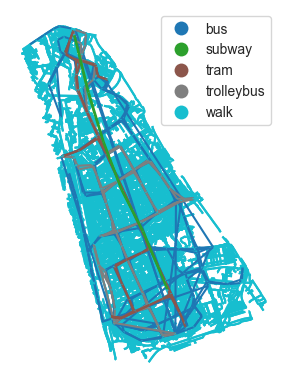

In [7]:
GraphGenerator.plot(intermodal_graph)

In [8]:
from blocksnet import AdjacencyCalculator

adjacency_matrix = AdjacencyCalculator(blocks=filtered_blocks_gdf, graph=intermodal_graph).get_dataframe()

In [9]:
adjacency_matrix.head()

,69,150,151,202,209,210,211,212,213,214,...,3419,3422,3463,3475,3478,3479,3480,3677,3824,3835
69,0.0,9.8,8.7,28.0,21.4,12.2,17.5,24.6,24.7,6.9,...,44.6,21.9,42.1,28.3,24.5,16.4,31.7,31.7,46.1,55.8
150,9.8,0.0,6.4,29.6,24.5,15.4,20.7,27.7,26.3,9.9,...,47.7,23.5,42.2,29.9,27.6,19.5,33.3,31.8,47.7,55.5
151,8.7,6.4,0.0,29.8,23.0,15.4,20.4,26.2,24.6,5.6,...,46.2,22.3,45.1,31.5,26.1,18.0,34.9,34.7,49.3,58.4
202,28.4,31.4,30.3,0.0,31.1,26.5,21.9,21.1,19.3,28.5,...,42.6,14.0,39.7,25.9,32.2,25.8,28.5,29.3,43.1,52.8
209,21.0,22.8,21.0,31.1,0.0,13.4,12.0,15.3,14.5,20.2,...,44.9,19.2,45.9,32.1,20.1,11.1,35.5,35.5,49.9,59.6


In [10]:
from blocksnet import City

district = City(
  blocks_gdf=filtered_blocks_gdf,
  adjacency_matrix=adjacency_matrix,
)

/Users/mvin/Code/blocksnet/venv/lib/python3.10/site-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/Users/mvin/Code/blocksnet/venv/lib/python3.10/site-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


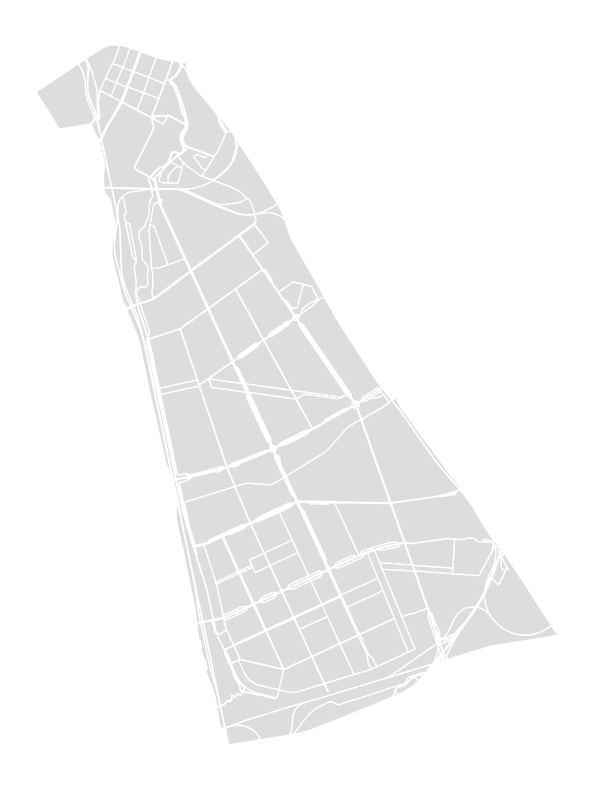

In [11]:
district.plot()

In [12]:
from blocksnet.method import Connectivity

conn = Connectivity(city_model=district)
calc = conn.calculate()

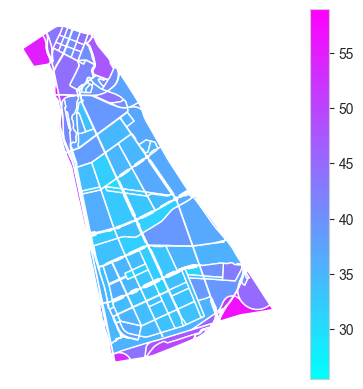

In [13]:
conn.plot(calc)

In [14]:
# calc.to_file('Василеостровский район.geojson')